In [2]:
import sys
from pathlib import Path

PROJECT_ROOT = Path.cwd().parent
sys.path.insert(0, str(PROJECT_ROOT))

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from matplotlib.lines import Line2D
import os

In [4]:
from config import DATA_DIR

weather_file = PROJECT_ROOT / DATA_DIR / "processed" / "weather_daily_1999_2025.csv"

figures_dir = PROJECT_ROOT / "figures" / "weather"
os.makedirs(figures_dir, exist_ok=True)

In [5]:
df = pd.read_csv(weather_file, parse_dates=["date"])
df["date"] = pd.to_datetime(df["date"], errors="coerce")
df.describe()

,date,temperature_2m_max,temperature_2m_min,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,wind_speed_10m_max,et0_fao_evapotranspiration
count,9862,9862.000000,9862.000000,9862.000000,9862.000000,9862.000000,9862.000000,9862.000000,9862.000000
mean,2012-07-01 12:00:00,17.466234,10.938674,17.583371,9.815747,3.393348,3.091199,13.893977,2.444288
min,1999-01-01 00:00:00,-2.800000,-10.800000,-8.300000,-15.400000,0.000000,0.000000,4.300000,0.180000
25%,2005-10-01 06:00:00,12.400000,5.700000,10.400000,2.800000,0.000000,0.000000,10.700000,1.300000
50%,2012-07-01 12:00:00,18.000000,10.800000,17.800000,9.200000,0.300000,0.300000,12.850000,2.250000
75%,2019-04-01 18:00:00,23.200000,16.800000,25.500000,17.500000,3.900000,3.500000,16.000000,3.500000
max,2025-12-31 00:00:00,35.800000,25.500000,40.700000,30.700000,78.700000,78.700000,53.700000,6.740000
std,NaN,6.950824,6.910280,9.366634,8.996720,6.416817,6.041540,4.755491,1.343506


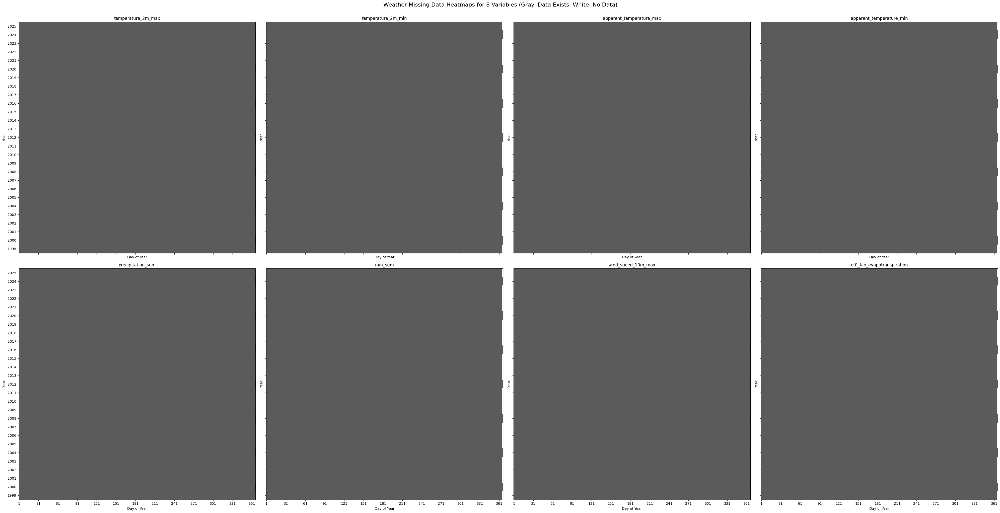

In [6]:
df['day_of_year'] = df['date'].dt.dayofyear
df['year'] = df['date'].dt.year

cmap = ListedColormap(['#5b5b5b', 'white'])

fig, axes = plt.subplots(2, 4, figsize=(40, 20), sharex=True, sharey=True)
axes = axes.flatten()

for i, col in enumerate(df.columns.tolist()[1:8+1]):
    df['is_missing'] = df[col].isna().astype(int)
    heatmap_data = df.pivot_table(
        values='is_missing',
        index='year',
        columns='day_of_year',
        aggfunc='first'
    ).fillna(1).astype(int)

    im = axes[i].imshow(
        heatmap_data,
        cmap=cmap,
        aspect='auto',
        interpolation='none',
        origin='lower'
    )

    axes[i].set_title(col, fontsize=12)
    axes[i].set_xlabel('Day of Year', fontsize=10)
    axes[i].set_ylabel('Year', fontsize=10)

    axes[i].set_xticks(np.arange(0, 365, 30))
    axes[i].set_xticklabels([str(i+1) for i in range(0, 365, 30)])

    axes[i].set_yticks(np.arange(len(heatmap_data.index)))
    axes[i].set_yticklabels(heatmap_data.index)

plt.tight_layout()
plt.suptitle('Weather Missing Data Heatmaps for 8 Variables (Gray: Data Exists, White: No Data)', fontsize=16, y=1.02)

plt.savefig(figures_dir / "weather-missing-features-heatmaps.png")
plt.show()

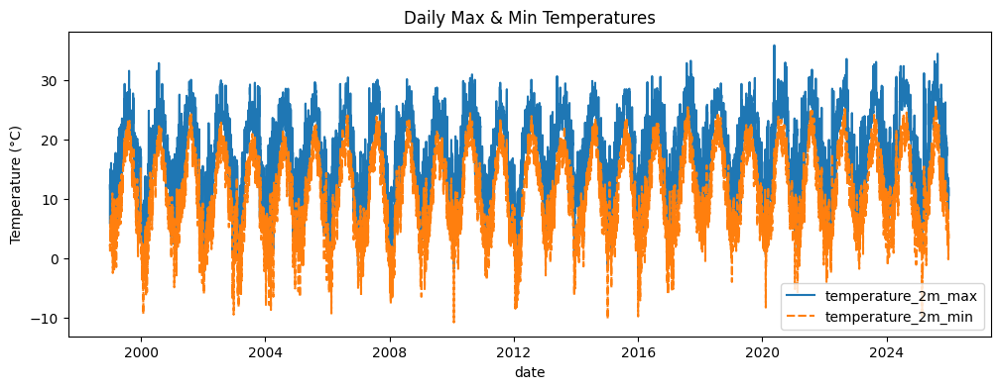

In [10]:
# Seasonal plots
df = pd.read_csv(weather_file, parse_dates=["date"])
df["date"] = pd.to_datetime(df["date"], errors="coerce")
df = df.set_index("date").asfreq('D')
plt.figure(figsize=(12,4))
sns.lineplot(data=df[['temperature_2m_max','temperature_2m_min']])
plt.title("Daily Max & Min Temperatures")
plt.ylabel("Temperature (°C)")

plt.savefig(figures_dir / "weather-max-min-temps.png")
plt.show()

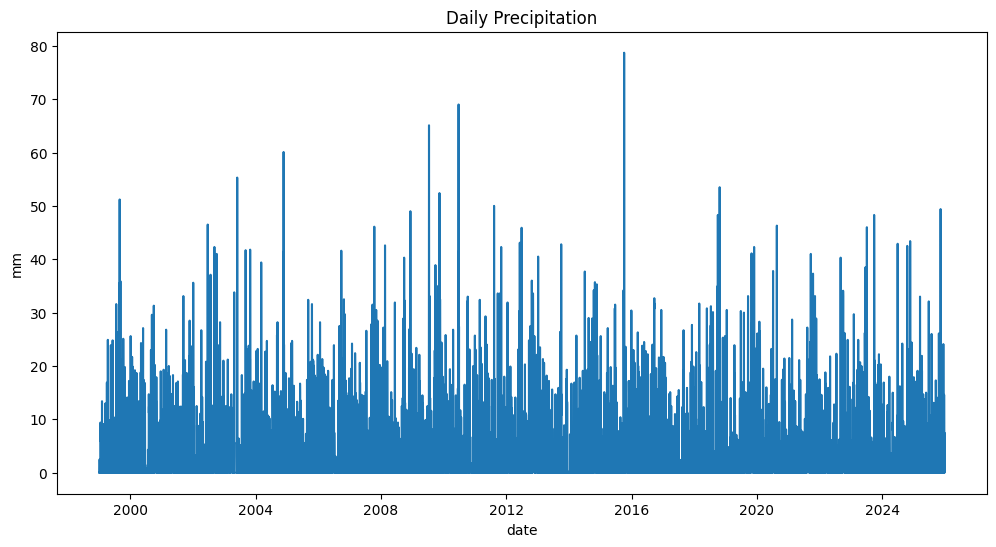

In [23]:
plt.figure(figsize=(12,6))
sns.lineplot(data=df['precipitation_sum'])
plt.title("Daily Precipitation")
plt.ylabel("mm")
plt.show()

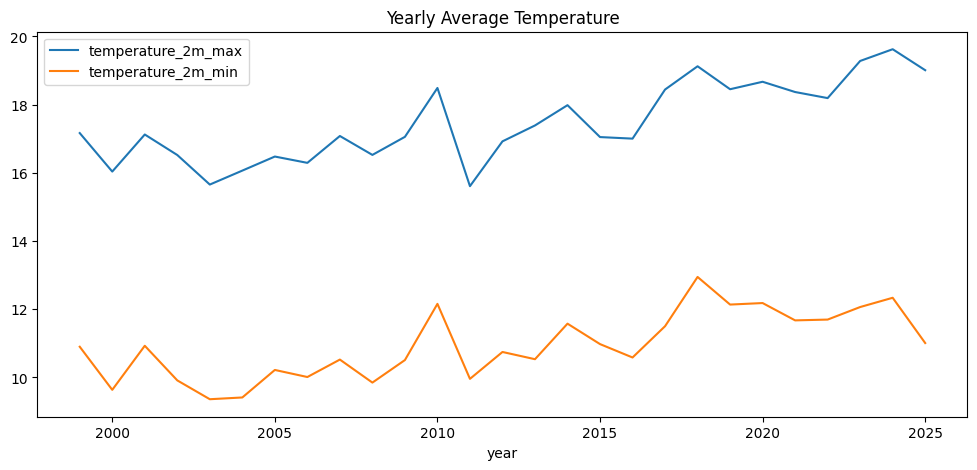

In [24]:
weather = df.copy()
weather['year'] = weather.index.year
temp_yearly = weather.groupby('year')[['temperature_2m_max','temperature_2m_min']].mean()
temp_yearly.plot(figsize=(12,5))
plt.title("Yearly Average Temperature")
plt.show()

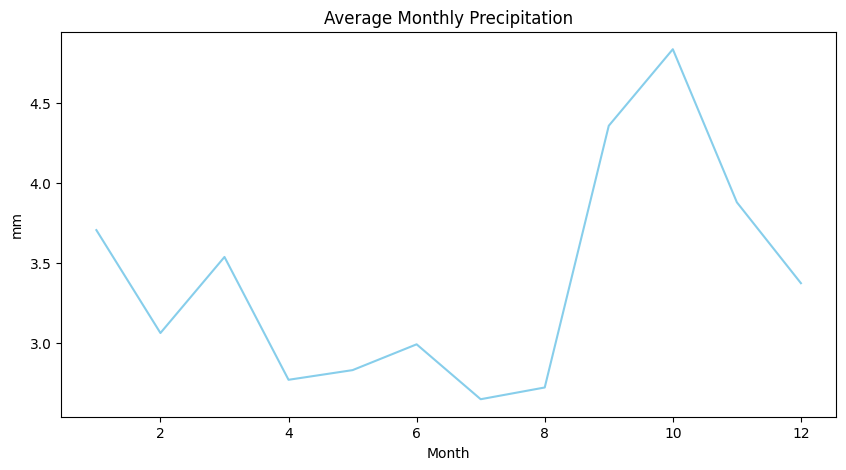

In [28]:
df['month'] = df.index.month
monthly_precip = df.groupby('month')['precipitation_sum'].mean()

plt.figure(figsize=(10,5))
plt.plot(monthly_precip.index, monthly_precip.values, color='skyblue')
plt.title("Average Monthly Precipitation")
plt.xlabel("Month")
plt.ylabel("mm")
plt.show()

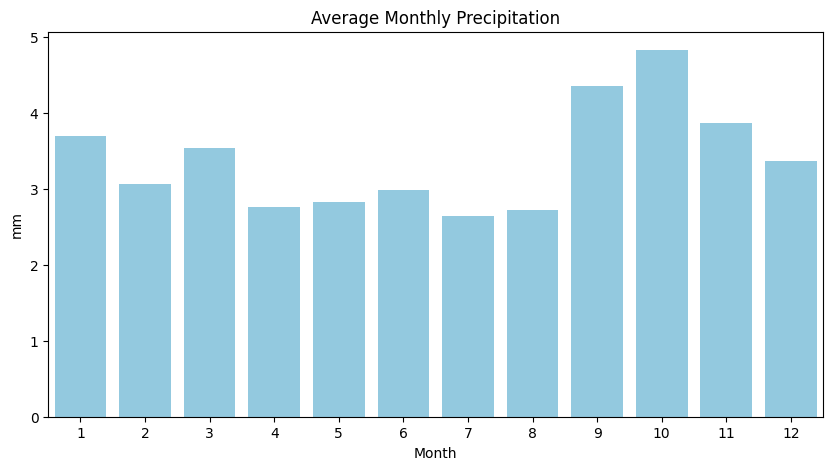

In [29]:
df['month'] = df.index.month
monthly_precip = df.groupby('month')['precipitation_sum'].mean()

plt.figure(figsize=(10,5))
sns.barplot(x=monthly_precip.index, y=monthly_precip.values, color='skyblue')
plt.title("Average Monthly Precipitation")
plt.xlabel("Month")
plt.ylabel("mm")
plt.show()

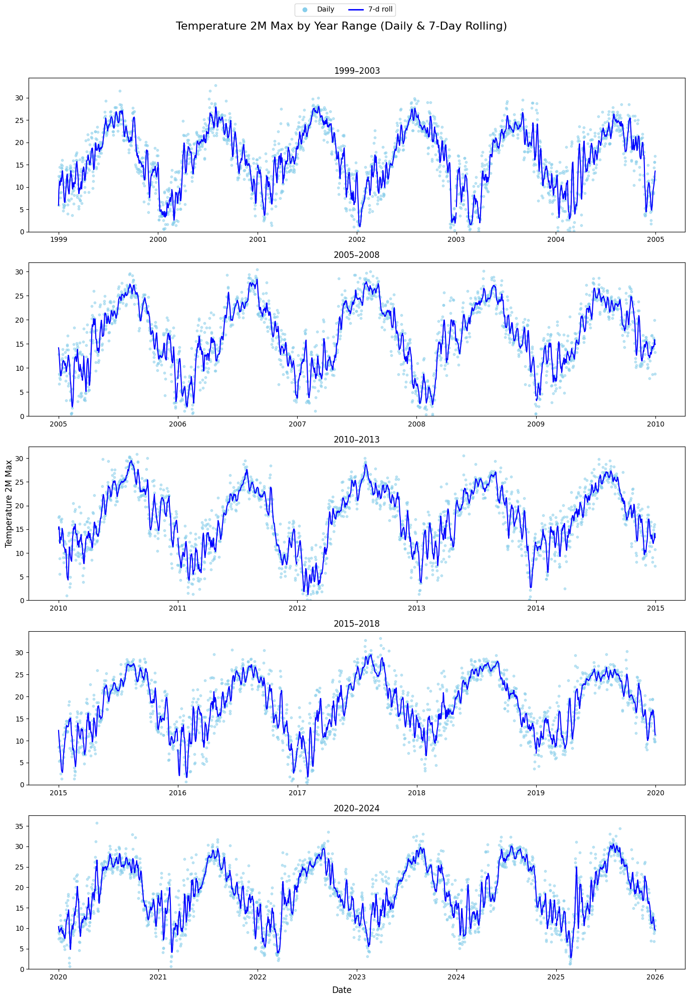

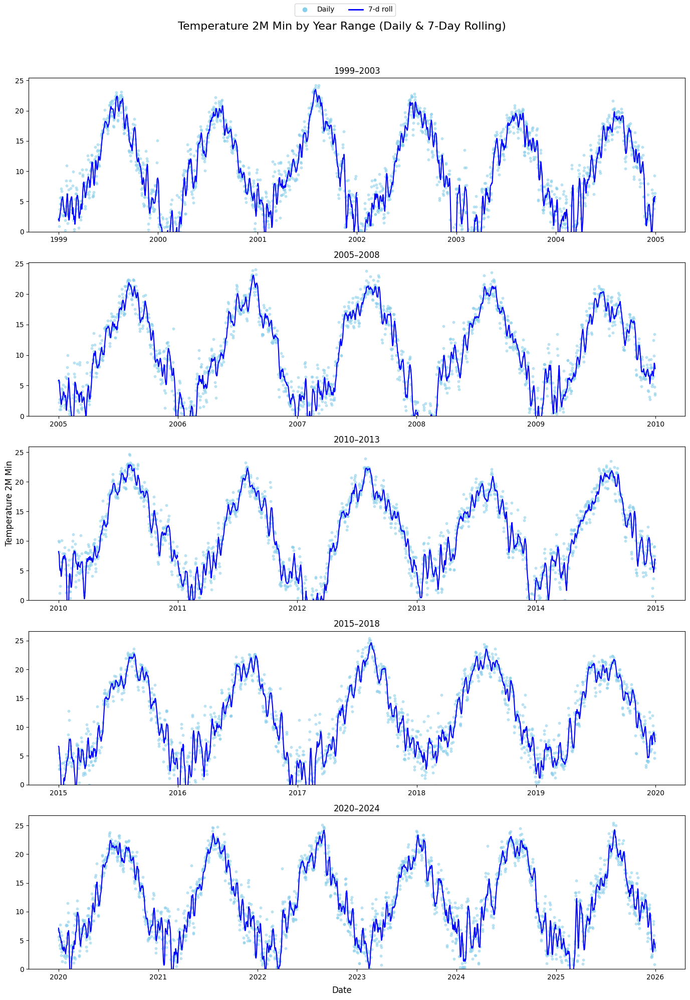

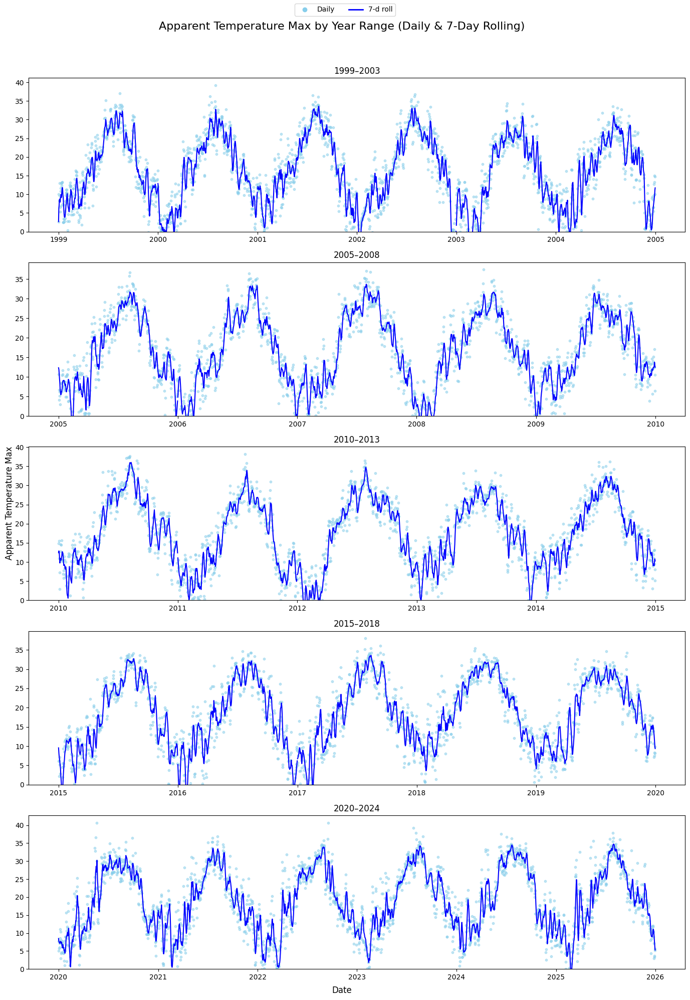

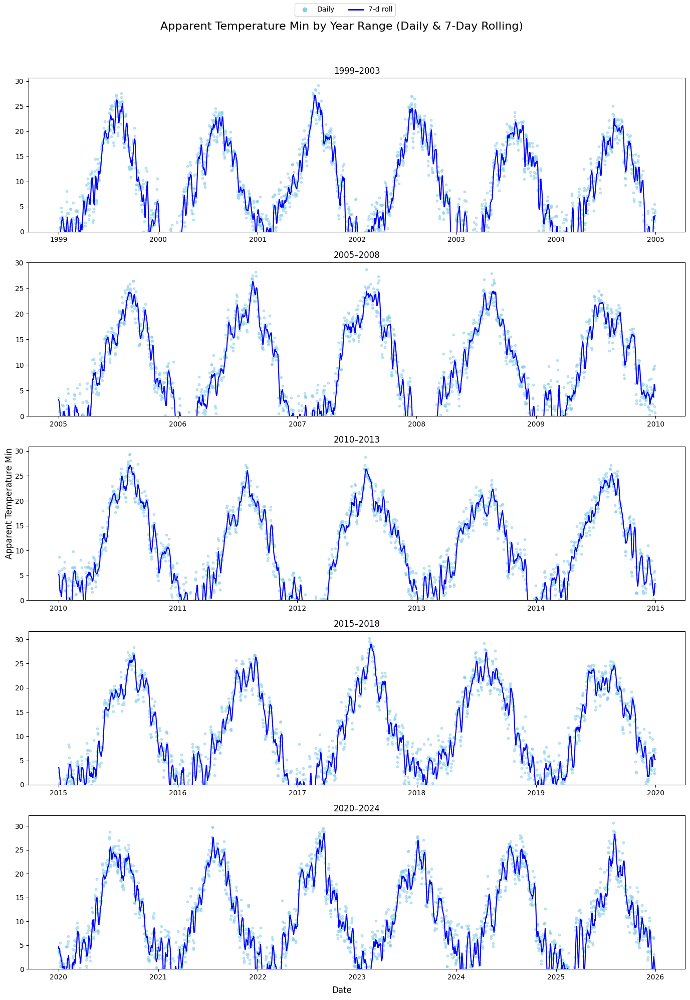

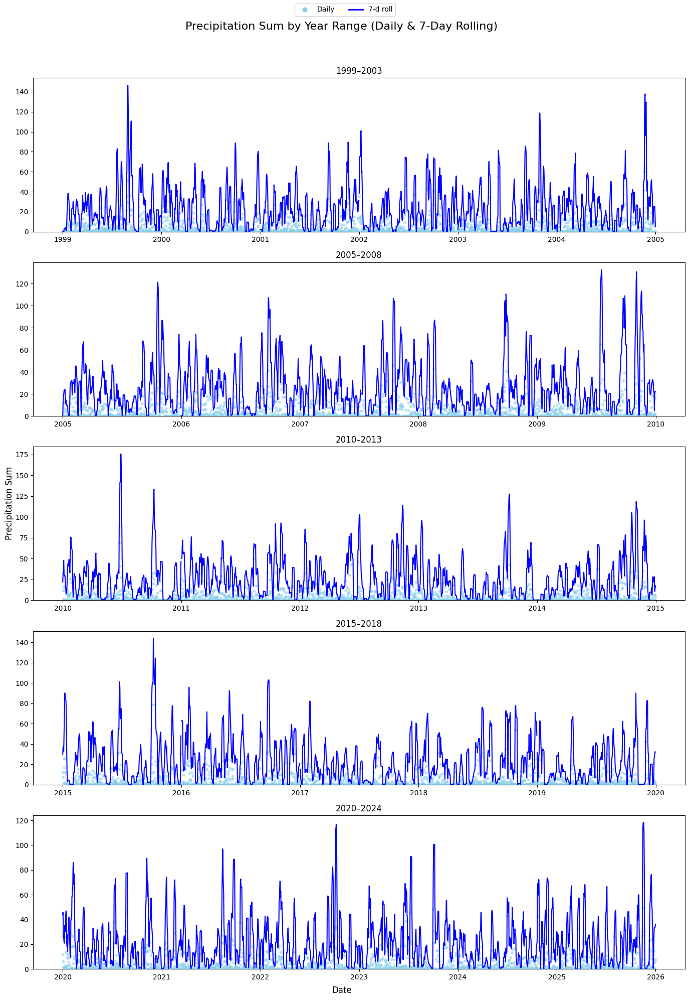

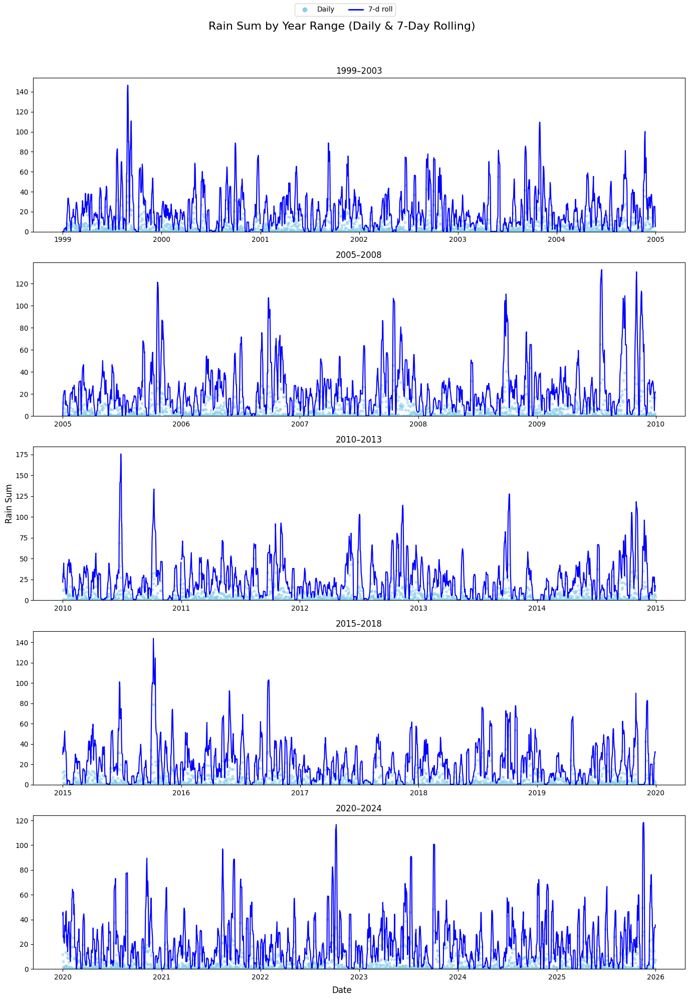

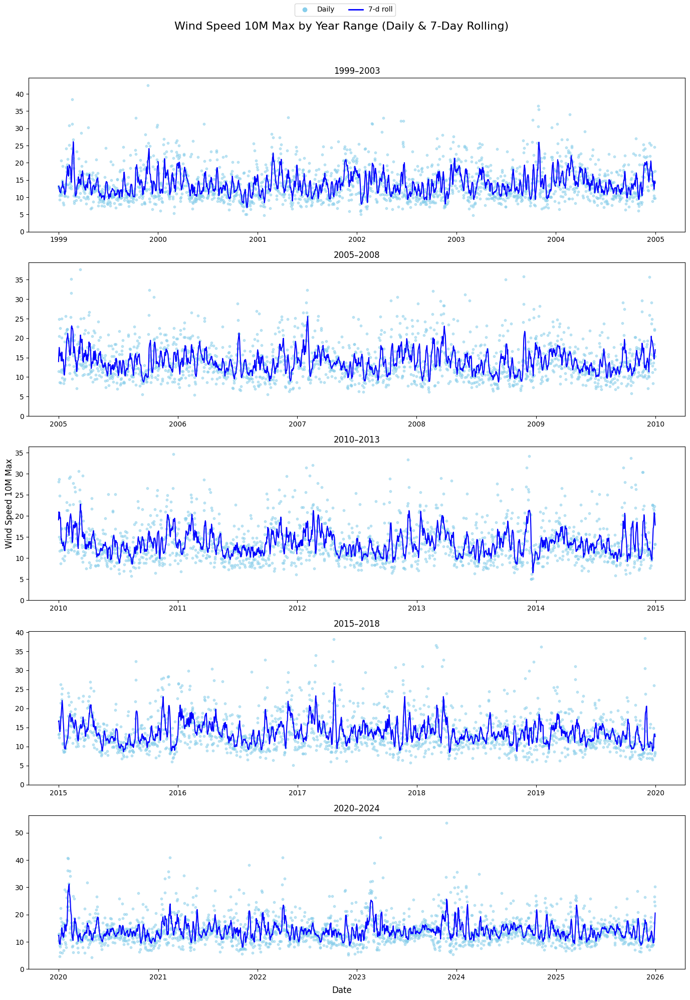

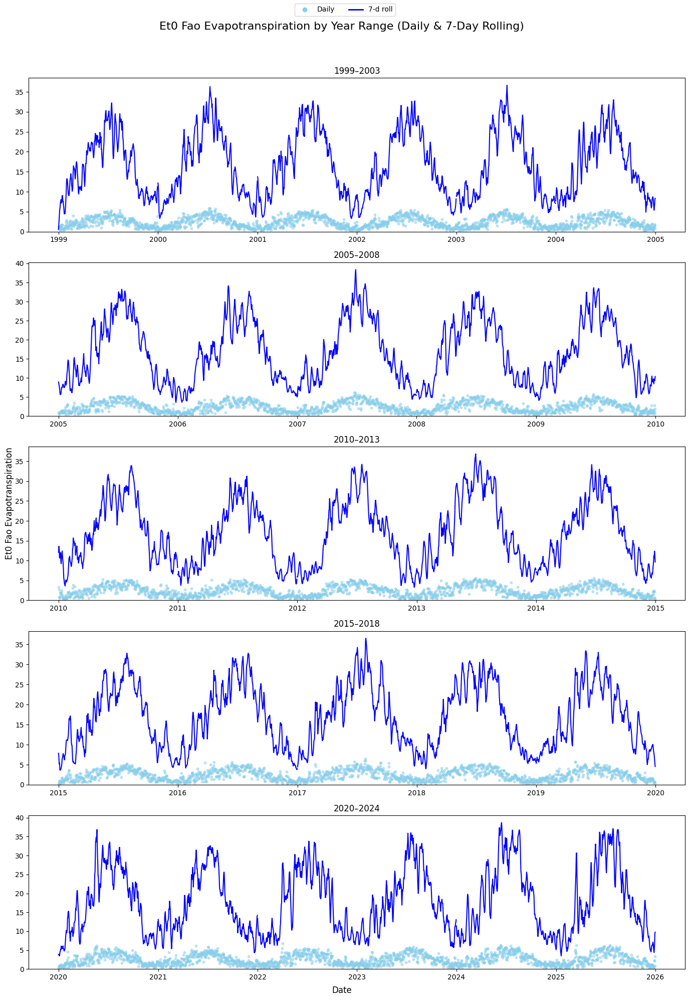

In [9]:
weather = pd.read_csv(weather_file, parse_dates=['date'])
weather = weather.set_index('date').asfreq('D')
weather['Year'] = weather.index.year
weather['Month'] = weather.index.month
weather['DayOfYear'] = weather.index.dayofyear

ROLL_WINDOW = 7

daily_vars = ['temperature_2m_max', 'temperature_2m_min', 'apparent_temperature_max',
              'apparent_temperature_min', 'precipitation_sum', 'rain_sum', 
              'wind_speed_10m_max', 'et0_fao_evapotranspiration']

for col in daily_vars:
    if 'precip' in col or 'rain' in col or 'et0' in col:
        weather[f'{col}_roll{ROLL_WINDOW}'] = weather[col].rolling(ROLL_WINDOW, min_periods=1).sum()
    else:
        weather[f'{col}_roll{ROLL_WINDOW}'] = weather[col].rolling(ROLL_WINDOW, min_periods=1).mean()

# Year ranges
year_ranges = [
    range(1999, 2005),
    range(2005, 2010),
    range(2010, 2015),
    range(2015, 2020),
    range(2020, 2026),
]

daily_handle = Line2D([], [], color='skyblue', marker='o',
                      linestyle='None', markersize=6, label='Daily')
roll_handle = Line2D([], [], color='blue',
                     linewidth=2, label=f'{ROLL_WINDOW}-d roll')

for col in daily_vars:
    fig, axes = plt.subplots(len(year_ranges), 1, figsize=(14, 20))
    for ax, yr_range in zip(axes, year_ranges):
        max_val = 0
        for year in yr_range:
            group = weather[weather['Year'] == year]
            if not group.empty:
                ax.scatter(group.index, group[col], color='skyblue', s=10, alpha=0.5, label=f'{year} daily')
                ax.plot(group.index, group[f'{col}_roll{ROLL_WINDOW}'], color='blue', label=f'{year} roll{ROLL_WINDOW}')
                max_val = max(max_val, group[col].max(), group[f'{col}_roll{ROLL_WINDOW}'].max())
        ax.set_ylim(0, max_val*1.05)
        ax.set_title(f"{min(yr_range)}–{max(yr_range)-1}")
    fig.suptitle(f"{col.replace('_',' ').title()} by Year Range (Daily & {ROLL_WINDOW}-Day Rolling)", fontsize=16)
    fig.supxlabel("Date")
    fig.supylabel(col.replace('_',' ').title())
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    fig.legend(
    handles=[daily_handle, roll_handle],
    loc='upper center',
    ncol=2,
    fontsize='medium'
    )

    plt.savefig(figures_dir / f"{col.lower()}-byyears.png")
    plt.show()


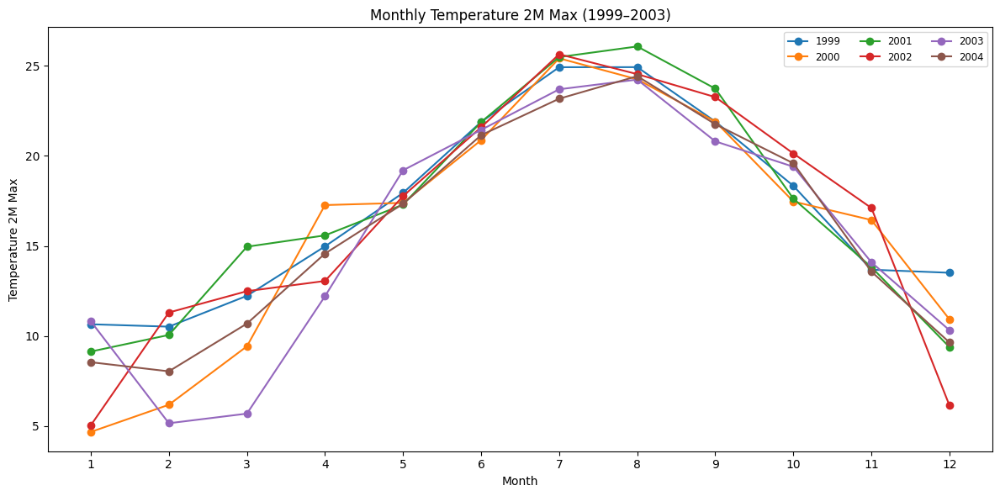

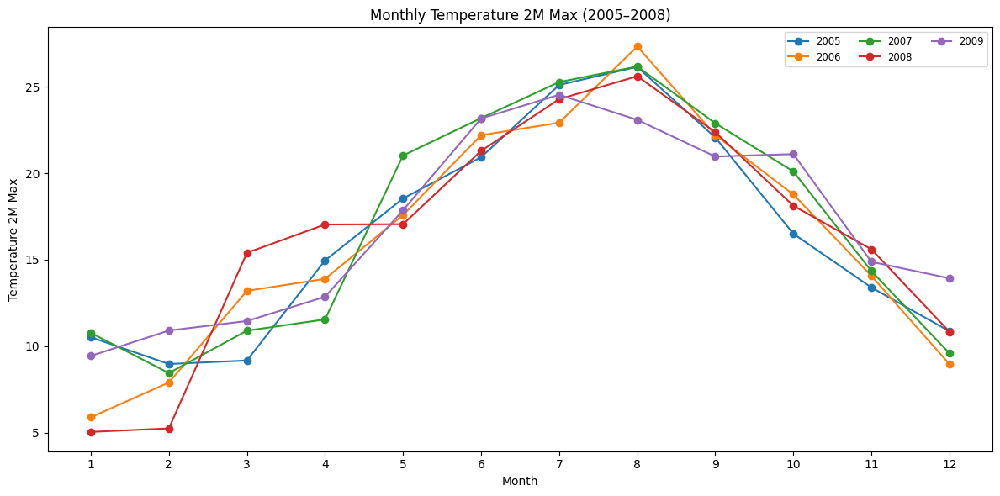

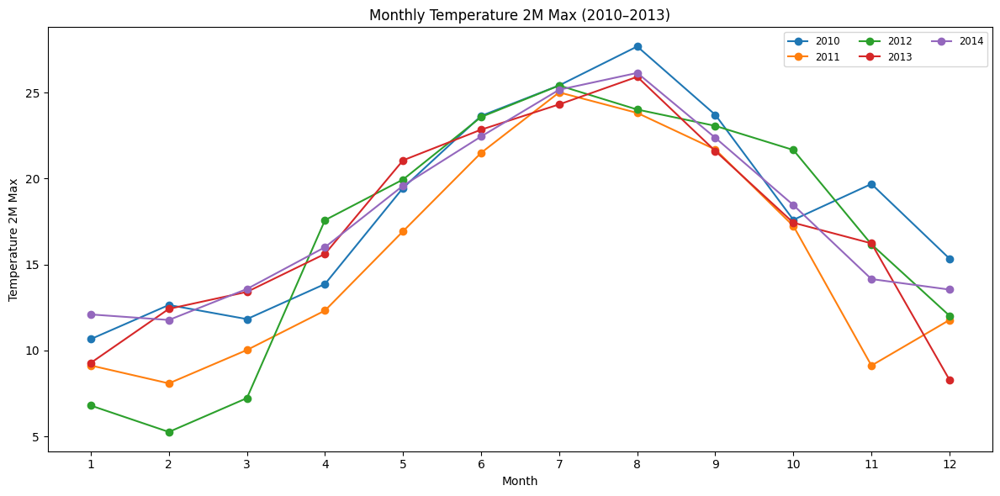

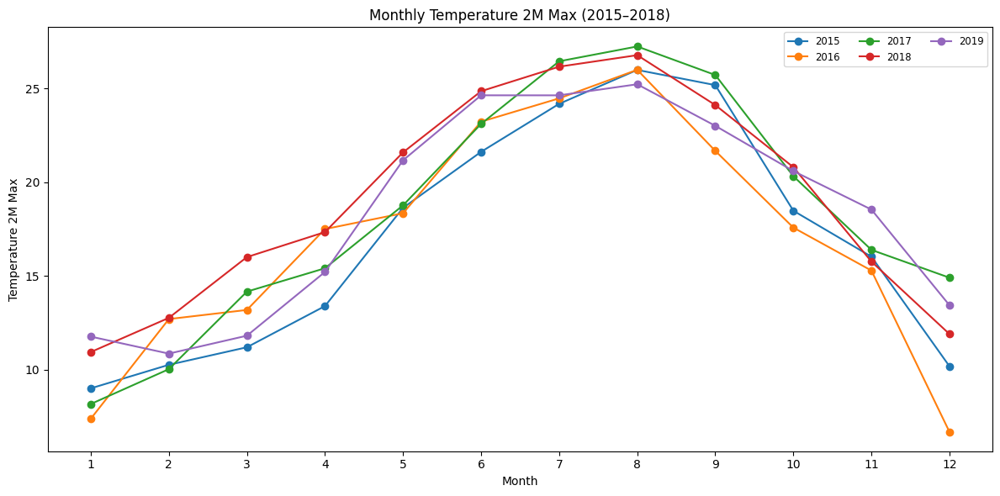

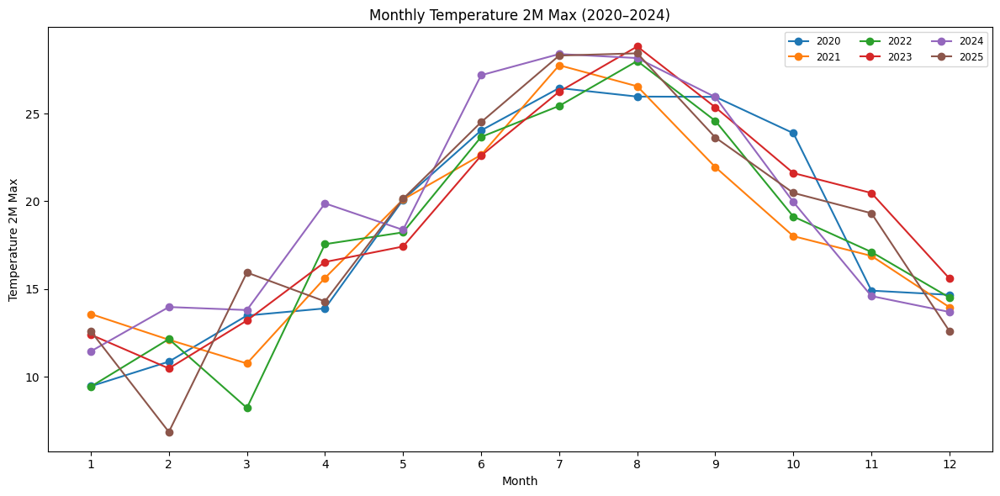

...

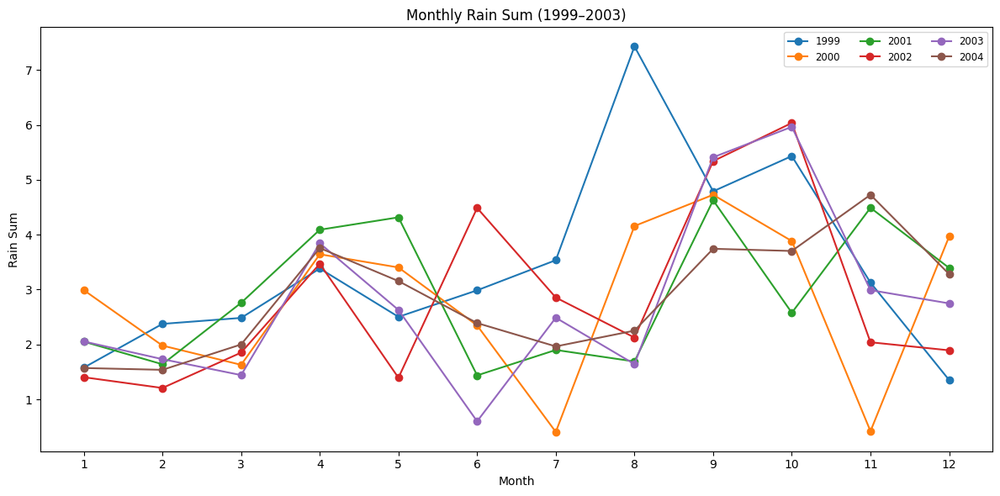

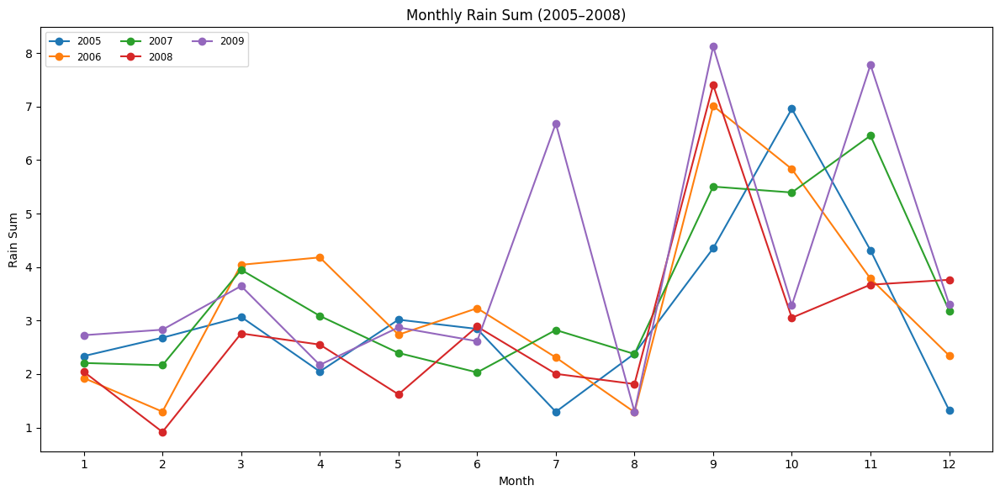

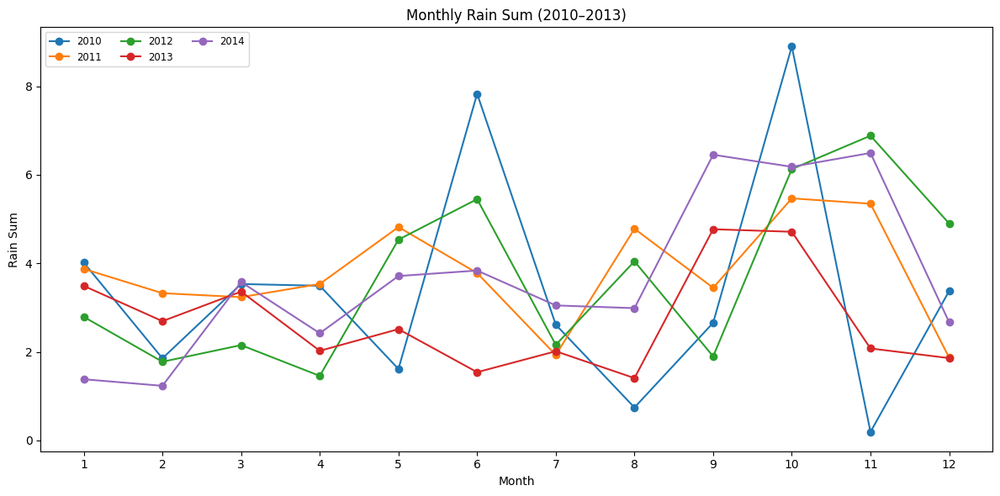

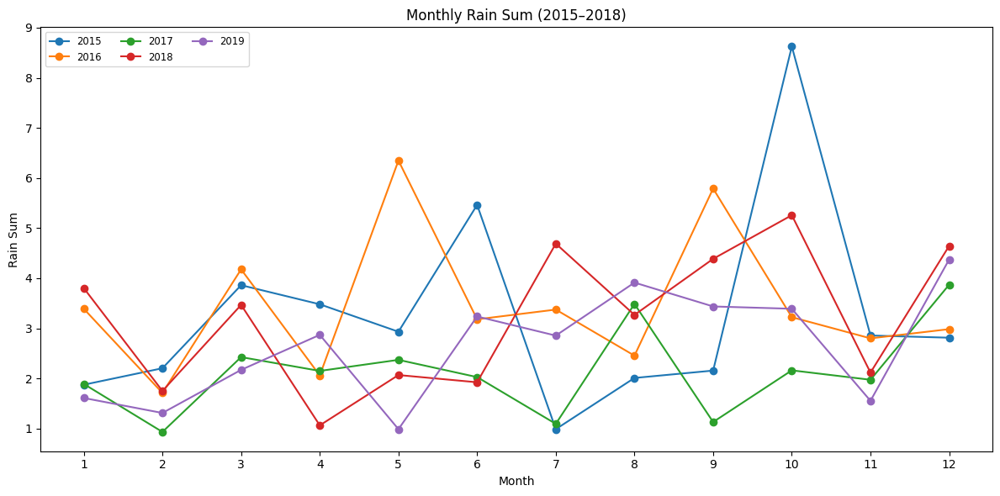

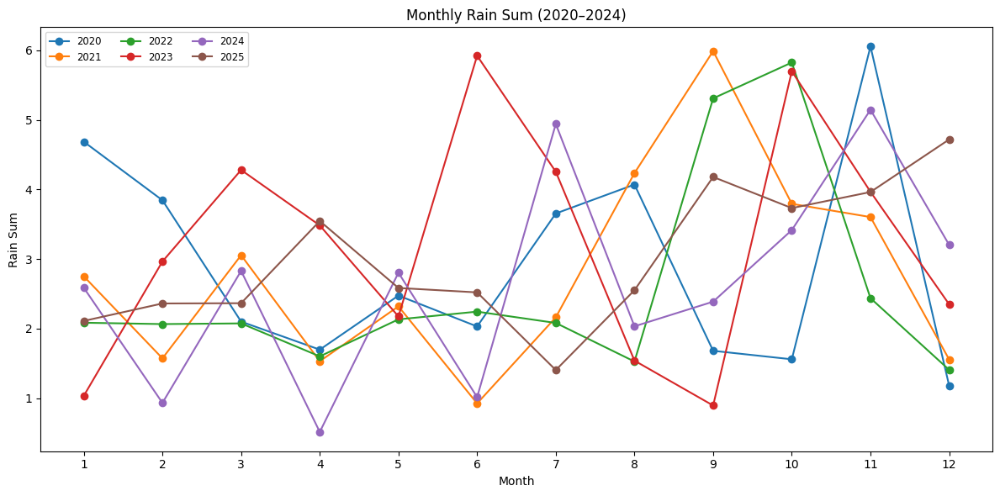

In [35]:

monthly_cols = ['temperature_2m_max', 'temperature_2m_min', 
                'apparent_temperature_max', 'apparent_temperature_min', 
                'precipitation_sum', 'rain_sum']

for col in monthly_cols:
    for yr_range in year_ranges:
        plt.figure(figsize=(12,6))
        for year in yr_range:
            monthly_avg = weather[weather['Year']==year].groupby('Month')[col].mean()
            plt.plot(monthly_avg.index, monthly_avg.values, marker='o', label=str(year))
        plt.title(f"Monthly {col.replace('_',' ').title()} ({min(yr_range)}–{max(yr_range)-1})")
        plt.xlabel("Month")
        plt.ylabel(col.replace('_',' ').title())
        plt.xticks(range(1,13))
        plt.legend(fontsize='small', ncol=3)
        plt.tight_layout()
        plt.show()


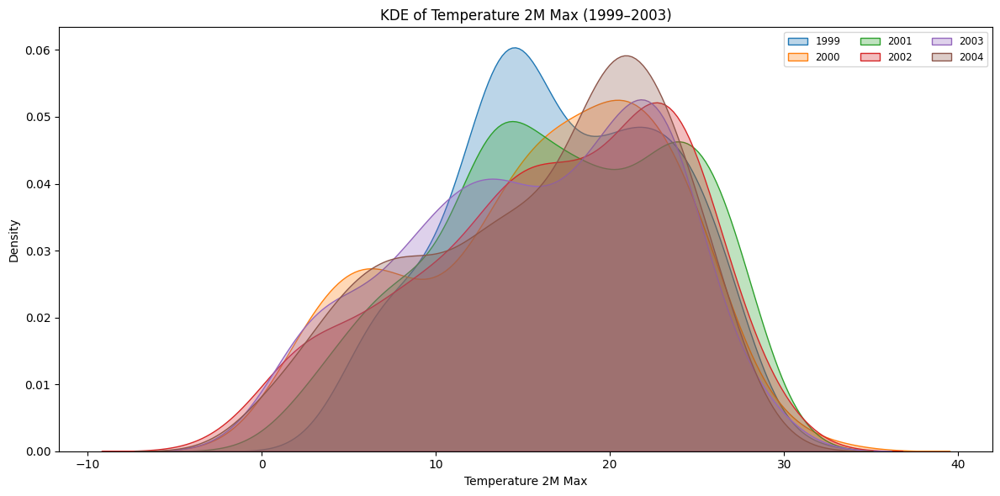

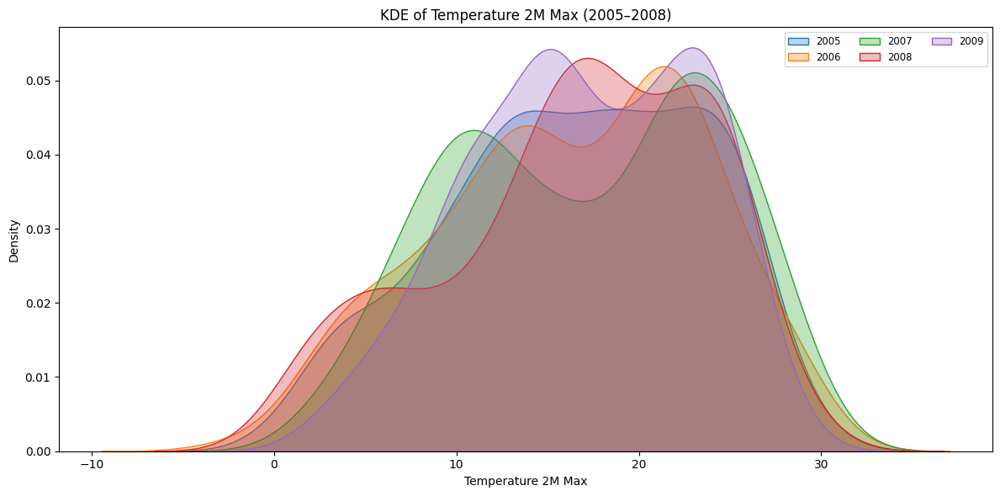

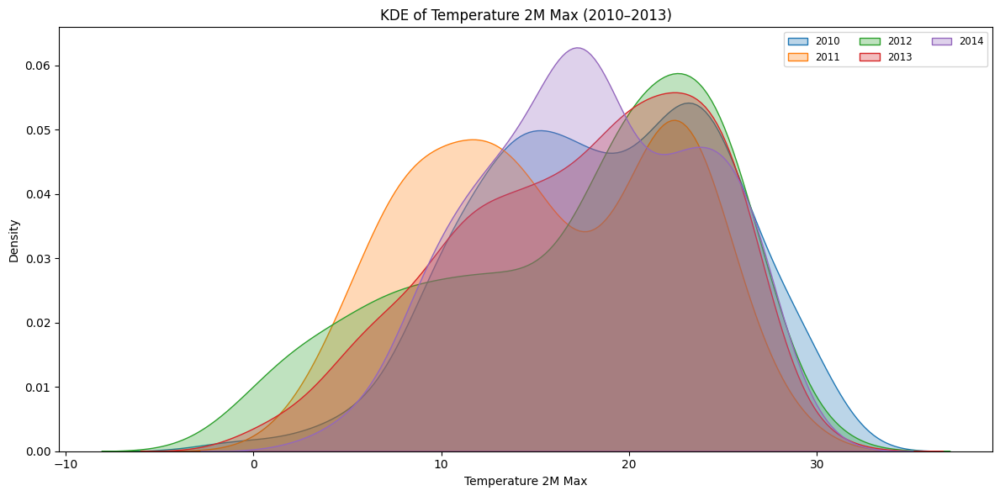

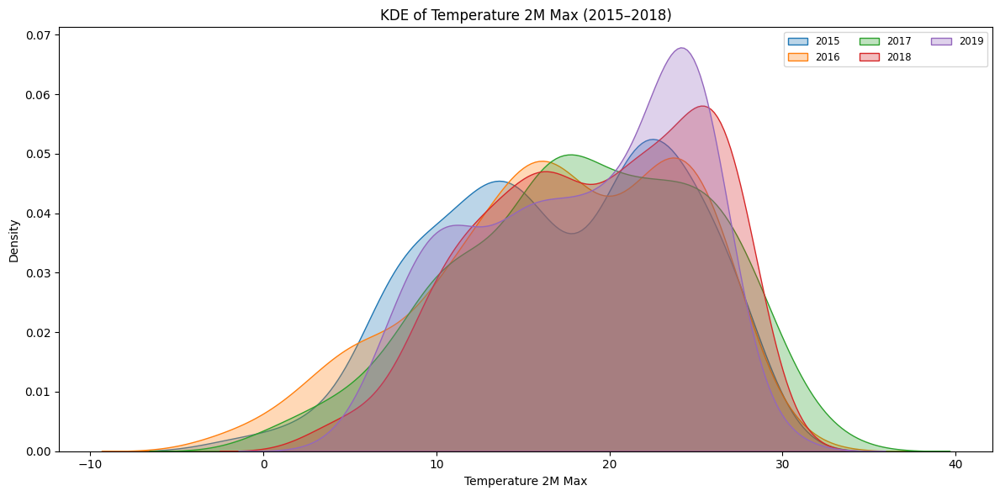

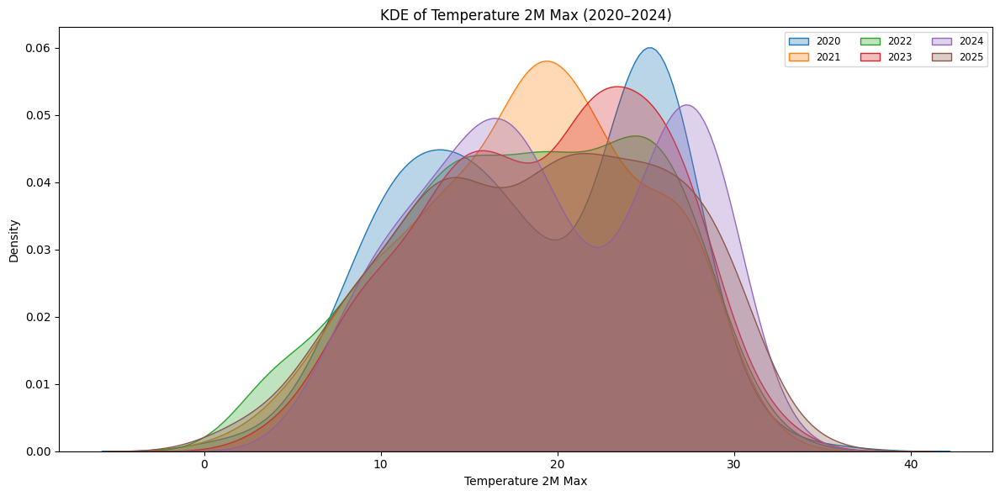

...

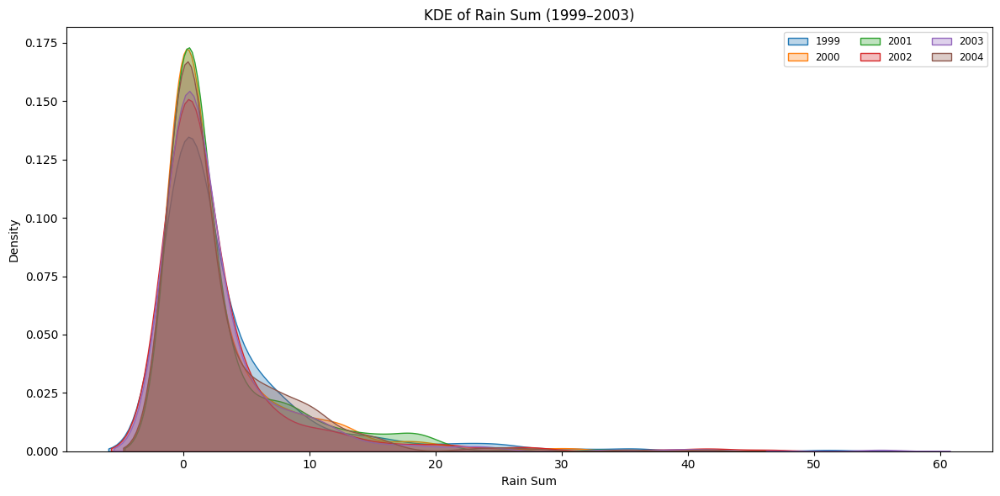

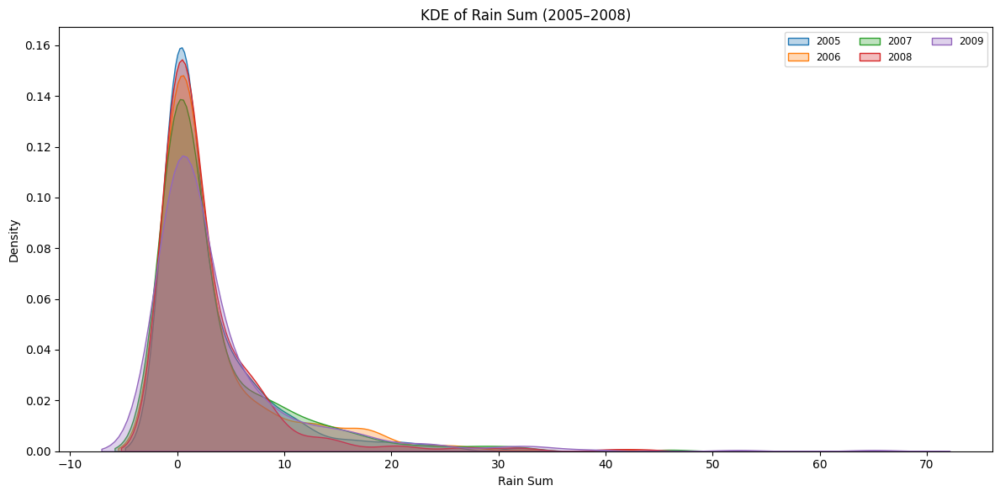

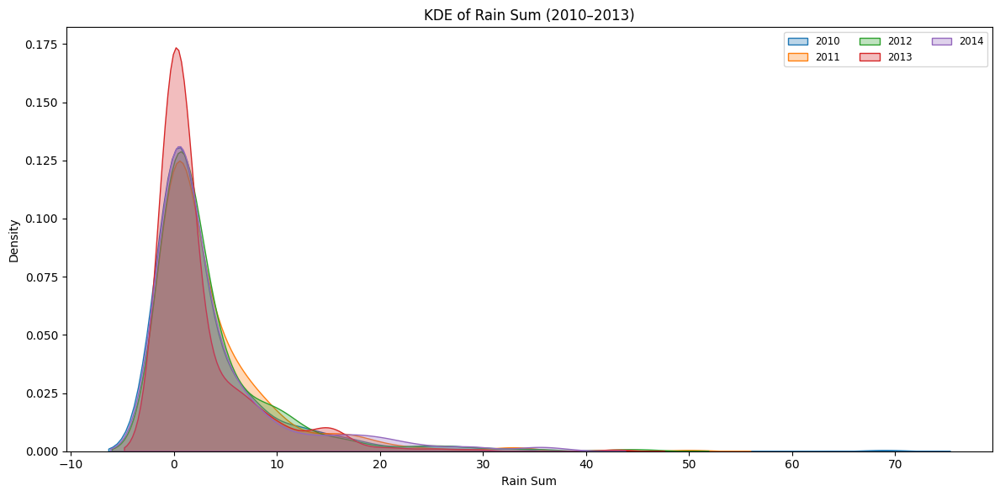

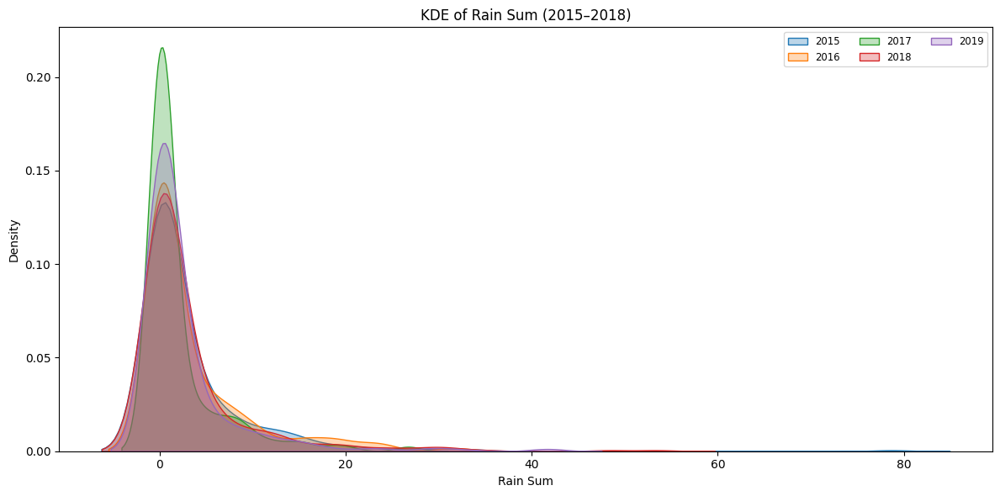

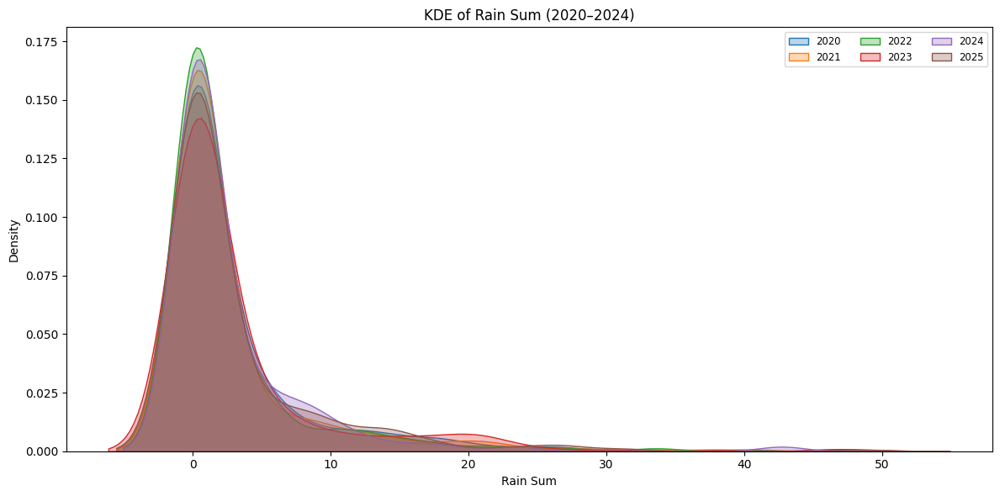

In [ ]:
kde_cols = ['temperature_2m_max', 'temperature_2m_min', 
            'apparent_temperature_max', 'apparent_temperature_min', 
            'precipitation_sum', 'rain_sum']

for col in kde_cols:
    for yr_range in year_ranges:
        plt.figure(figsize=(12,6))
        for year in yr_range:
            data = weather[weather['Year'] == year][col].dropna()
            if not data.empty:
                sns.kdeplot(data, fill=True, alpha=0.3, label=str(year))
        plt.title(f"KDE of {col.replace('_',' ').title()} ({min(yr_range)}–{max(yr_range)-1})")
        plt.xlabel(col.replace('_',' ').title())
        plt.ylabel("Density")
        plt.legend(fontsize='small', ncol=3)
        plt.tight_layout()
        plt.show()